In [1]:
import pandas as pd
import pandas_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import linear_model
from sklearn import svm
from sklearn import naive_bayes
from sklearn import neighbors

from sklearn import tree
from sklearn import ensemble
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns', 100)

In [2]:
df = pd.read_csv('data/AirlinePassengerSatisfaction/AirlinePassengerSatisfaction.csv', encoding='utf-8')
df

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


In [3]:
df.drop('id', axis=1, inplace=True)
df.drop('Unnamed: 0', axis=1, inplace=True)

In [6]:
df.profile_report(title='Campus Placement Data - Report')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df.fillna(df.median(), inplace=True)

C:\Users\ishih\AppData\Local\Temp\ipykernel_12804\3604797450.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.fillna(df.median(), inplace=True)


In [5]:
df["Gender"] = df['Gender'].map({"Female":0,"Male":1})
df['Customer Type'] = df['Customer Type'].map({"disloyal Customer":0,"Loyal Customer":1})
df['Type of Travel'] = df['Type of Travel'].map({"Personal Travel":0,"Business travel":1})
df['Class'] = df['Class'].map({"Eco":0,"Eco Plus":1, 'Business':2})
df['satisfaction'] = df['satisfaction'].map({"neutral or dissatisfied":0,"satisfied":1})

In [6]:
df2 =  df[(df['Inflight wifi service'] != 0) &
   (df['Departure/Arrival time convenient'] != 0) &
   (df['Ease of Online booking'] != 0) &
   (df['Gate location'] != 0) &
   (df['Food and drink'] != 0) &
   (df['Online boarding'] != 0) &
   (df['Seat comfort'] != 0) &
   (df['Inflight entertainment'] != 0) &
   (df['On-board service'] != 0) &
   (df['Leg room service'] != 0) &
   (df['Checkin service'] != 0)].copy()

In [7]:
X = df2.drop('satisfaction', axis=1)
y = df2['satisfaction']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)
print(X_train.shape)
print(X_test.shape)

(76563, 22)
(19141, 22)


In [8]:
models = [linear_model.LogisticRegression(),
          neighbors.KNeighborsClassifier(),
          #svm.SVC(),
          naive_bayes.GaussianNB(),
          tree.DecisionTreeClassifier(max_depth=3),
          ensemble.RandomForestClassifier(max_depth=3),
          ensemble.GradientBoostingClassifier()]

In [21]:
from scipy import stats
a = np.arange(12)
b = [a,a]
stats.mode(np.array(b),axis=0)

ModeResult(mode=array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]]), count=array([[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]]))

In [26]:
from scipy import stats
df_model_comp = pd.DataFrame()
result = []
for model in models:
    dic = dict()
    print(model.__class__.__name__)
    dic['モデル名'] = model.__class__.__name__
    model.fit(X_train,y_train)
    y_pred = model.predict(X_train)
    dic['Accuracy(訓練)'] = metrics.accuracy_score(y_train, y_pred)
    dic['Precision(訓練)'] = metrics.precision_score(y_train, y_pred)
    dic['Recall(訓練)'] = metrics.recall_score(y_train, y_pred)
    dic['F1(訓練)'] = metrics.f1_score(y_train, y_pred)
    y_pred = model.predict(X_test)
    dic['Accuracy(テスト)'] = metrics.accuracy_score(y_test, y_pred)
    dic['Precision(テスト)'] = metrics.precision_score(y_test, y_pred)
    dic['Recall(テスト)'] = metrics.recall_score(y_test, y_pred)
    dic['F1(テスト)'] = metrics.f1_score(y_test, y_pred)
    df_model_comp = df_model_comp.append(dic,ignore_index=True)
    result.append(y_pred.copy())
dic['モデル名'] = 'ensemble'
y_pred_ans, _ = stats.mode(np.array(result),axis=0)
y_pred_ans = y_pred_ans[0]
dic['Accuracy(テスト)'] = metrics.accuracy_score(y_test, y_pred_ans)
dic['Precision(テスト)'] = metrics.precision_score(y_test, y_pred_ans)
dic['Recall(テスト)'] = metrics.recall_score(y_test, y_pred_ans)
dic['F1(テスト)'] = metrics.f1_score(y_test, y_pred_ans)
df_model_comp = df_model_comp.append(dic,ignore_index=True)
df_model_comp

LogisticRegression


C:\Users\ishih\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KNeighborsClassifier
GaussianNB
DecisionTreeClassifier
RandomForestClassifier
GradientBoostingClassifier


,モデル名,Accuracy(訓練),Precision(訓練),Recall(訓練),F1(訓練),Accuracy(テスト),Precision(テスト),Recall(テスト),F1(テスト)
0,LogisticRegression,0.806643,0.742976,0.835402,0.786483,0.804556,0.738430,0.835099,0.783795
1,KNeighborsClassifier,0.844272,0.831657,0.795753,0.813309,0.764223,0.731783,0.701232,0.716181
2,GaussianNB,0.883429,0.882921,0.837608,0.859668,0.887937,0.889251,0.840517,0.864198
3,DecisionTreeClassifier,0.880660,0.857056,0.864173,0.860600,0.882451,0.861899,0.860837,0.861368
4,RandomForestClassifier,0.910205,0.918269,0.866471,0.891618,0.914529,0.926691,0.867118,0.895916
5,GradientBoostingClassifier,0.942662,0.947102,0.916690,0.931648,0.944987,0.953187,0.915271,0.933844
6,ensemble,0.942662,0.947102,0.916690,0.931648,0.920485,0.938697,0.869335,0.902685


In [24]:
y_pred_ans[0]

array([0, 0, 1, ..., 0, 0, 0], dtype=int64)

In [22]:
X_train.dtypes[X_train.dtypes != 'uint8'].index

Index(['gender', 'ssc_p', 'ssc_b', 'hsc_p', 'hsc_b', 'degree_p', 'workex',
       'etest_p', 'specialisation', 'mba_p', 'salary'],
      dtype='object')

In [27]:
from sklearn.preprocessing import StandardScaler

scaling_columns = X_train.dtypes[X_train.dtypes != 'uint8'].index
scaler = StandardScaler().fit(X_train[scaling_columns])

scaled_train = pd.DataFrame(scaler.transform(X_train[scaling_columns]), columns=scaling_columns, index=X_train.index)
X_train.update(scaled_train)

scaled_test = pd.DataFrame(scaler.transform(X_test[scaling_columns]), columns=scaling_columns, index=X_test.index)
X_test.update(scaled_test)

In [28]:
df_model_comp = pd.DataFrame()
for model in models:
    dic = dict()
    dic['モデル名'] = model.__class__.__name__
    model.fit(X_train,y_train)
    y_pred = model.predict(X_train)
    dic['Accuracy(訓練)'] = metrics.accuracy_score(y_train, y_pred)
    dic['Precision(訓練)'] = metrics.precision_score(y_train, y_pred)
    dic['Recall(訓練)'] = metrics.recall_score(y_train, y_pred)
    dic['F1(訓練)'] = metrics.f1_score(y_train, y_pred)
    y_pred = model.predict(X_test)
    dic['Accuracy(テスト)'] = metrics.accuracy_score(y_test, y_pred)
    dic['Precision(テスト)'] = metrics.precision_score(y_test, y_pred)
    dic['Recall(テスト)'] = metrics.recall_score(y_test, y_pred)
    dic['F1(テスト)'] = metrics.f1_score(y_test, y_pred)
    df_model_comp = df_model_comp.append(dic,ignore_index=True)
df_model_comp

,モデル名,Accuracy(訓練),Precision(訓練),Recall(訓練),F1(訓練),Accuracy(テスト),Precision(テスト),Recall(テスト),F1(テスト)
0,LogisticRegression,0.897692,0.881154,0.878481,0.879816,0.900946,0.886968,0.878448,0.882688
1,KNeighborsClassifier,0.954756,0.966365,0.926096,0.945802,0.936994,0.948030,0.900862,0.923844
2,GaussianNB,0.883495,0.883435,0.837148,0.859669,0.888355,0.890179,0.840517,0.864635
3,DecisionTreeClassifier,0.880660,0.857056,0.864173,0.860600,0.882451,0.861899,0.860837,0.861368
4,RandomForestClassifier,0.911576,0.911096,0.878267,0.894380,0.916619,0.921012,0.878818,0.899420
5,GradientBoostingClassifier,0.942662,0.947102,0.916690,0.931648,0.944987,0.953187,0.915271,0.933844


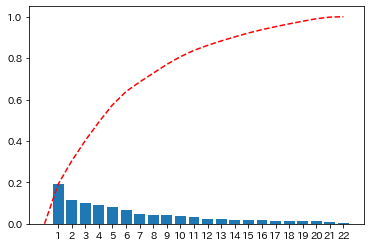

In [29]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)
plt.bar([n for n in range(1, len(pca.explained_variance_ratio_)+1)], pca.explained_variance_ratio_)
ev_ratio = pca.explained_variance_ratio_
ev_ratio = np.hstack([0,ev_ratio.cumsum()])
plt.plot(ev_ratio, color='red', linestyle='dashed')
plt.xticks(range(1, X_train.shape[-1]+1))
plt.show()

In [30]:
n = 11
columns=[f'PC{i+1}' for i in range(n)]
X_train_pca = pd.DataFrame(X_train_pca[:,:n], columns=columns)
X_test_pca = pd.DataFrame(X_test_pca[:,:n], columns=columns)

LogisticRegression
KNeighborsClassifier
GaussianNB
DecisionTreeClassifier
RandomForestClassifier
GradientBoostingClassifier


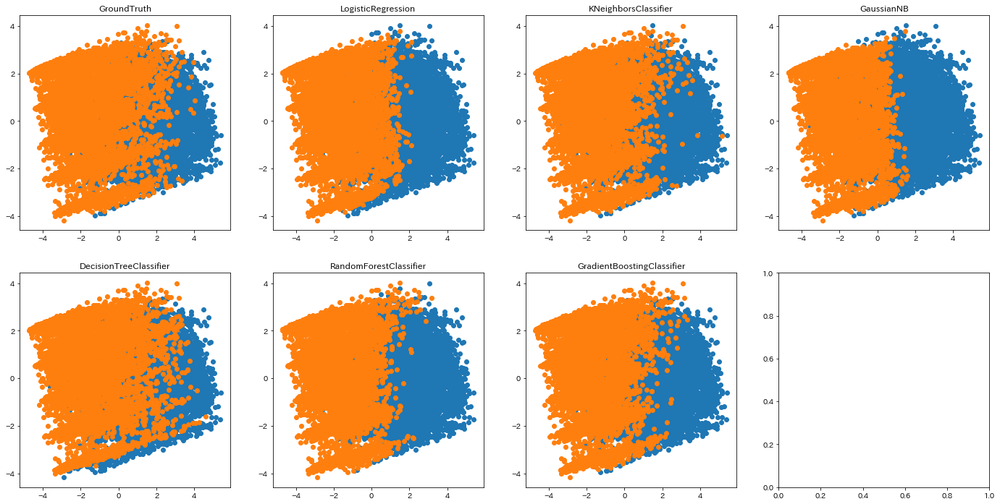

,モデル名,Accuracy(訓練),Precision(訓練),Recall(訓練),F1(訓練),Accuracy(テスト),Precision(テスト),Recall(テスト),F1(テスト)
0,LogisticRegression,0.897692,0.881154,0.878481,0.879816,0.900946,0.886968,0.878448,0.882688
1,KNeighborsClassifier,0.954756,0.966365,0.926096,0.945802,0.936994,0.948030,0.900862,0.923844
2,GaussianNB,0.883495,0.883435,0.837148,0.859669,0.888355,0.890179,0.840517,0.864635
3,DecisionTreeClassifier,0.880660,0.857056,0.864173,0.860600,0.882451,0.861899,0.860837,0.861368
4,RandomForestClassifier,0.914476,0.913599,0.882863,0.897968,0.919544,0.921795,0.885468,0.903266
5,GradientBoostingClassifier,0.942662,0.947102,0.916690,0.931648,0.944987,0.953187,0.915271,0.933844


In [31]:
df_model_comp = pd.DataFrame()

fig, ax = plt.subplots(ncols=4, nrows=2, figsize=(24.0,12.0))
ax = ax.flatten()
for j in np.unique(y_test):
    X_tmp = X_test_pca[y_test.values == j]
    ax[0].scatter(X_tmp['PC1'], X_tmp['PC2'], label=j)
ax[0].set_title('GroundTruth')

for i, model in enumerate(models):
    dic = dict()
    print(model.__class__.__name__)
    dic['モデル名'] = model.__class__.__name__
    model.fit(X_train,y_train)
    y_pred = model.predict(X_train)
    dic['Accuracy(訓練)'] = metrics.accuracy_score(y_train, y_pred)
    dic['Precision(訓練)'] = metrics.precision_score(y_train, y_pred)
    dic['Recall(訓練)'] = metrics.recall_score(y_train, y_pred)
    dic['F1(訓練)'] = metrics.f1_score(y_train, y_pred)
    y_pred = model.predict(X_test)
    dic['Accuracy(テスト)'] = metrics.accuracy_score(y_test, y_pred)
    dic['Precision(テスト)'] = metrics.precision_score(y_test, y_pred)
    dic['Recall(テスト)'] = metrics.recall_score(y_test, y_pred)
    dic['F1(テスト)'] = metrics.f1_score(y_test, y_pred)
    df_model_comp = df_model_comp.append(dic,ignore_index=True)
    for j in np.unique(y_pred):
        X_tmp = X_test_pca[y_pred == j]
        ax[i+1].scatter(X_tmp['PC1'], X_tmp['PC2'], label=j)
    ax[i+1].set_title(model.__class__.__name__)
plt.show()

df_model_comp